In [1]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

def apply_convolution ( image , kernel ):
  # Assertions pour valider les e n t r e s
  assert isinstance ( image , np . ndarray ) , "L’image doit tre un tableau NumPy "
  assert isinstance ( kernel , np . ndarray ) , "Le noyau doit etre un tableau NumPy "
  assert len ( kernel . shape ) == 2 , "Le noyau doit tre une matrice 2D"
  assert kernel . shape [0] == kernel . shape [1] , "Le noyau doit etre carre "
  assert kernel . shape [0] % 2 == 1, "Le noyau doit avoir une taille impaire "
  assert len ( image . shape ) in [2 , 3] , "L’image doit tre en niveaux de gris (2D) ou RGB (3D)"
  if len ( image . shape ) == 3: # Image RGB
    assert image . shape [2] == 3 , "L’image RGB doit avoir 3 canaux "
    height , width , channels = image . shape
    output = np . zeros_like ( image , dtype = np . float32 )
    # Appliquer le filtre sur chaque canal
    for c in range ( channels ):
      output [: , :, c] = convolve_channel ( image [: , : , c ],kernel )
  else : # Image en niveaux de gris
    output = convolve_channel ( image , kernel )
    # Normaliser pour viter des valeurs hors plage [0 , 255]
  output = np . clip ( output , 0 , 255) . astype ( np . uint8 )
  return output
def convolve_channel ( image , kernel ) :
  # Assertions pour valider les dimensions
  assert image . shape [0] >= kernel . shape [0] , "L’image est trop petite pour le noyau en hauteur "

  assert image . shape [1] >= kernel . shape [1] , "L’image est trop petite pour le noyau en largeur "
  # Dimensions de l’image et du noyau
  img_height , img_width = image . shape
  kernel_height , kernel_width = kernel . shape
  pad_height , pad_width = kernel_height // 2, kernel_width// 2

  # Ajouter un padding pour g r e r les bords
  padded_image = np . pad ( image , (( pad_height , pad_height ) , (pad_width , pad_width )) , mode ='constant')
  output = np . zeros_like ( image , dtype = np . float32 )
  # Appliquer la convolution
  for i in range ( img_height ) :
    for j in range ( img_width ):
      region = padded_image [i :i + kernel_height , j: j +kernel_width ]
      output [i , j] = np . sum ( region * kernel )
  return output

In [3]:
def image_load(img,chanel):
  # chanel : 1 ( Gray ) ou 3 ( RGB )
  if chanel == 1:
    gray_image = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
    assert gray_image is not None , " Erreur : Impossible de charger.l’image en niveaux de gris "


    return gray_image
  elif chanel == 3:
    rgb_image = cv2.imread(img)
    assert rgb_image is not None , " Erreur : Impossible de charger l’image RGB "

    rgb_image = cv2 . cvtColor ( rgb_image , cv2 . COLOR_BGR2RGB )

    return rgb_image

In [5]:
def display_images ( original , filtered , title ):
  plt.figure ( figsize =(10 , 5) )
  plt.subplot (1 , 2, 1)
  plt.title (" Image originale ")
  plt.imshow ( original , cmap ='gray' if len ( original . shape ) ==2 else None )
  plt.axis ('off')
  plt.subplot (1 , 2, 2)
  plt.title ( title )
  plt.imshow ( filtered , cmap ='gray' if len ( filtered . shape ) ==2 else None )
  plt.axis ('off')
  plt.show ()


In [31]:
# D f i n i r des noyaux de convolution par exemple
# 1. Filtre de flou ( moyenne )
blur_kernel = np . array ([
  [1/9 , 1/9 , 1/9] ,
  [1/9 , 1/9 , 1/9] ,
  [1/9 , 1/9 , 1/9]
  ])
blur_kernel_5x5 = np . array ([
  [1/25 , 1/25 , 1/25,1/25,1/25] ,
  [1/25 , 1/25 , 1/25,1/25,1/25] ,
  [1/25 , 1/25 , 1/25,1/25,1/25],
  [1/25 , 1/25 , 1/25,1/25,1/25],
  [1/25 , 1/25 , 1/25,1/25,1/25]
  ])
blur_kernel_7x7 = np . array ([
  [1/49 , 1/49 , 1/49,1/49,1/49,1/49,1/49] ,
  [1/49 , 1/49 , 1/49,1/49,1/49,1/49,1/49],
  [1/49 , 1/49 , 1/49,1/49,1/49,1/49,1/49],
  [1/49 , 1/49 , 1/49,1/49,1/49,1/49,1/49],
  [1/49 , 1/49 , 1/49,1/49,1/49,1/49,1/49],
  [1/49 , 1/49 , 1/49,1/49,1/49,1/49,1/49],
  [1/49 , 1/49 , 1/49,1/49,1/49,1/49,1/49]
  ])
blur_kernel_9x9 = np . array ([
  [1/81 , 1/81 , 1/81,1/81,1/81,1/81,1/81,1/81,1/81] ,
  [1/81 , 1/81 , 1/81,1/81,1/81,1/81,1/81,1/81,1/81] ,
  [1/81 , 1/81 , 1/81,1/81,1/81,1/81,1/81,1/81,1/81],
  [1/81 , 1/81 , 1/81,1/81,1/81,1/81,1/81,1/81,1/81],
  [1/81 , 1/81 , 1/81,1/81,1/81,1/81,1/81,1/81,1/81],
  [1/81 , 1/81 , 1/81,1/81,1/81,1/81,1/81,1/81,1/81],
  [1/81 , 1/81 , 1/81,1/81,1/81,1/81,1/81,1/81,1/81],
  [1/81 , 1/81 , 1/81,1/81,1/81,1/81,1/81,1/81,1/81],
  [1/81 , 1/81 , 1/81,1/81,1/81,1/81,1/81,1/81,1/81]
  ])

# 2. Filtre Sobel horizontal ( d t e c t i o n de contours horizontaux )
sobel_horizontal = np . array ([
  [ -1 , 0 , 1] ,
  [ -2 , 0 , 2] ,
  [ -1 , 0 , 1]
  ])

# 3. Filtre Sobel vertical ( d t e c t i o n de contours verticaux ) 
sobel_vertical = np . array ([
  [ -1 , -2, -1] ,
  [0 , 0, 0] ,
  [1 , 2, 1]
  ])
# TODO Ajouter les autres filtres ( tous ) y compris ceux
# 4 filtre d identité
identity = np.array([
  [0, 0, 0],
  [0, 1, 0],
  [0, 0, 0]
])
# 5 filtre de ridge
ridge = np.array([
  [0, -1, 0],
  [-1, 4, -1],
  [0, -1, 0]
])
# 6 filtre edge detection
edge = np.array([
  [-1, -1, -1],
  [-1, 8, -1],
  [-1, -1, -1]
])
# 7 filtre sharpen
sharpen = np.array([
  [0, -1, 0],
  [-1, 5, -1],
  [0, -1, 0]
])
# 8 filtre box blur
box_blur = np.array([
  [1/9, 1/9, 1/9],
  [1/9, 1/9, 1/9],
  [1/9, 1/9, 1/9]
])
# 9 filtre gaussiane blur 3x3
gaussian_blur = np.array([
  [1/16, 2/16, 1/16],
  [2/16, 4/16, 2/16],
  [1/16, 2/16 , 1/16]
])
# 10 filtre gaussian_blur 5x5
gaussian_blur_5x5= np.array([
  [ 1/256, 4/256, 6/256, 4/256, 1/256],
  [4/256, 16/256, 24/256, 16/256, 4/256],
  [6/256, 24/256, 36/256, 24/256, 6/256],
  [4/256, 16/256, 24/256, 16/256, 4/256],
  [1/256, 4/256, 6/256, 4/256, 1/256]
])
# 11 unsharp masking 5x5
unsharp_masking = np.array([
  [-1/256, -4/256, -6/256, -4/256, -1/256],
  [-4/256, -16/256, -24/256, -16/256, -4/256],
  [-6/256, -24/256, 476/256, -24/256, -6/256],
  [-4/256, -16/256, -24/256, -16/256, -4/256],
  [-1/256, -4/256, -6/256, -4/256, -1/256]
])



In [33]:
data_dir_resultat = os.path.join(os.getcwd (), 'C:/Users/yyyiyi/Downloads/image_resultat/')
data_dir = os.path.join(os.getcwd (), 'C:/Users/yyyiyi/Downloads/images_origine')


C:/Users/yyyiyi/Downloads/images_origine\cameraman.bmp


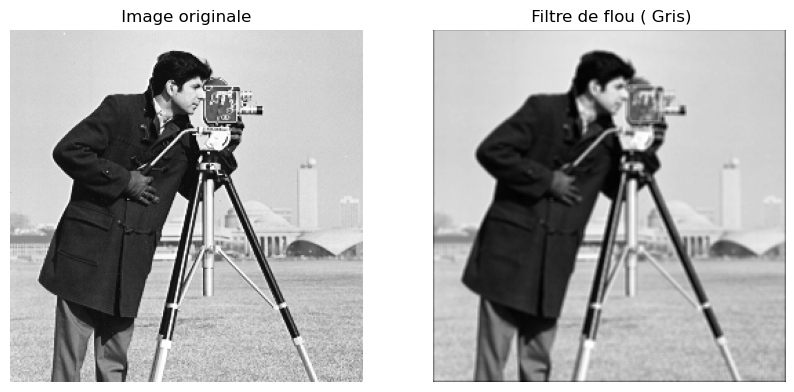

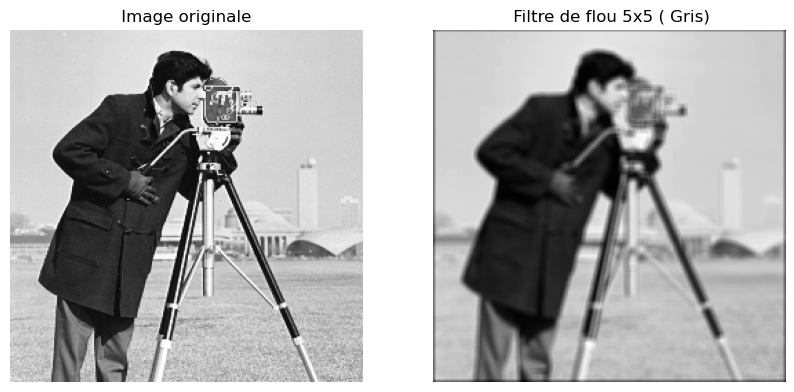

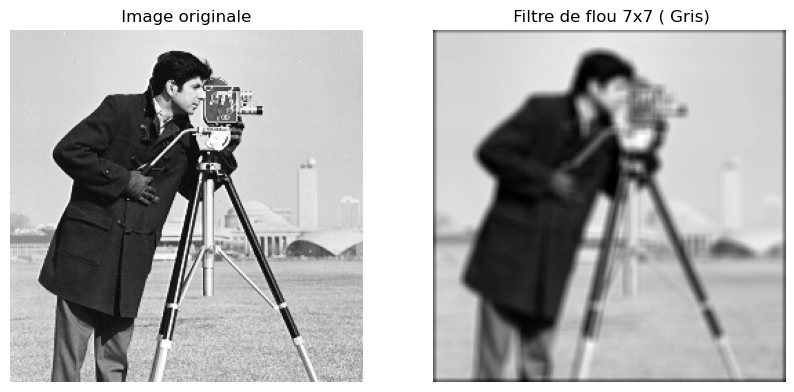

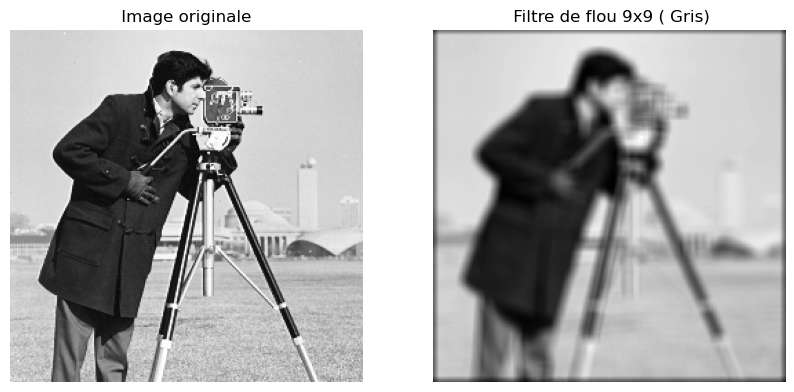

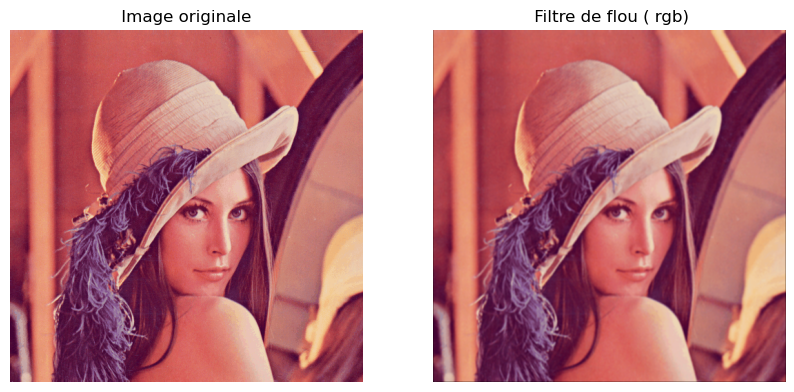

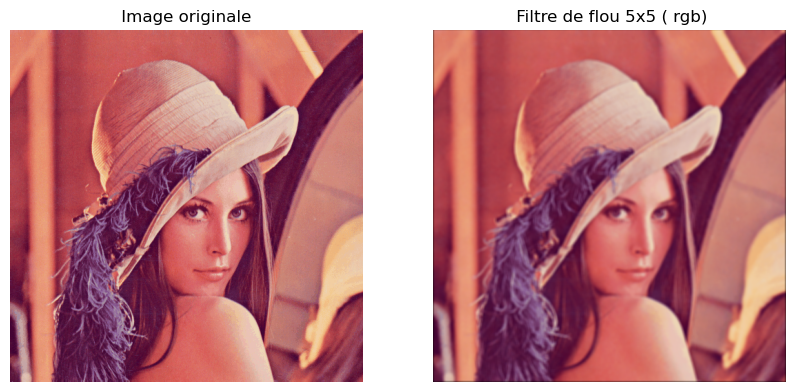

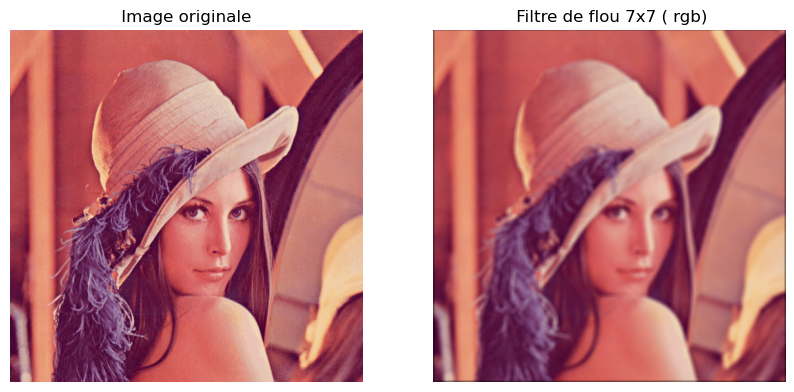

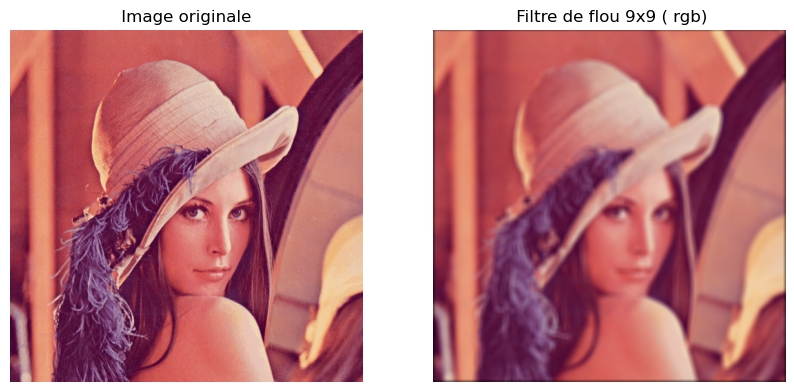

True

In [35]:
image_path =os.path.join(data_dir,"cameraman.bmp")
print(image_path)
gray_image = image_load(image_path,1)
image_path =os.path.join(data_dir,"lenna.bmp")
rgb_image = image_load(image_path,3)

blurred_gray = apply_convolution ( gray_image , blur_kernel )
blurred_gray_5x5 = apply_convolution ( gray_image , blur_kernel_5x5 )
blurred_gray_7x7 = apply_convolution ( gray_image , blur_kernel_7x7 )
blurred_gray_9x9 = apply_convolution ( gray_image , blur_kernel_9x9 )

blurred_rgb = apply_convolution ( rgb_image , blur_kernel )
blurred_rgb_5x5 = apply_convolution ( rgb_image , blur_kernel_5x5 )
blurred_rgb_7x7 = apply_convolution ( rgb_image , blur_kernel_7x7 )
blurred_rgb_9x9 = apply_convolution ( rgb_image , blur_kernel_9x9 )

display_images ( gray_image , blurred_gray , " Filtre de flou ( Gris)")
display_images ( gray_image , blurred_gray_5x5 , " Filtre de flou 5x5 ( Gris)")
display_images ( gray_image , blurred_gray_7x7 , " Filtre de flou 7x7 ( Gris)")
display_images ( gray_image , blurred_gray_9x9 , " Filtre de flou 9x9 ( Gris)")

display_images ( rgb_image , blurred_rgb , " Filtre de flou ( rgb)")
display_images ( rgb_image , blurred_rgb_5x5 , " Filtre de flou 5x5 ( rgb)")
display_images ( rgb_image , blurred_rgb_7x7 , " Filtre de flou 7x7 ( rgb)")
display_images ( rgb_image , blurred_rgb_9x9 , " Filtre de flou 9x9 ( rgb)")

cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_gray.jpg"), blurred_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_gray_5x5.jpg"), blurred_gray_5x5 )
cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_gray_7x7.jpg"), blurred_gray_7x7 )
cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_gray_9x9.jpg"), blurred_gray_9x9 )

cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_rgb.jpg"), blurred_rgb )
cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_rgb_5x5.jpg"), blurred_rgb_5x5 )
cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_rgb_7x7.jpg"), blurred_rgb_7x7 )
cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_rgb_9x9.jpg"), blurred_rgb_9x9 )


C:/Users/yyyiyi/Downloads/images_origine\cameraman.bmp


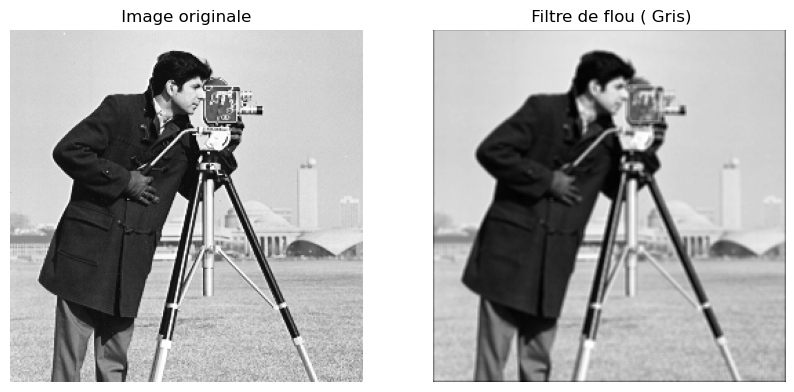

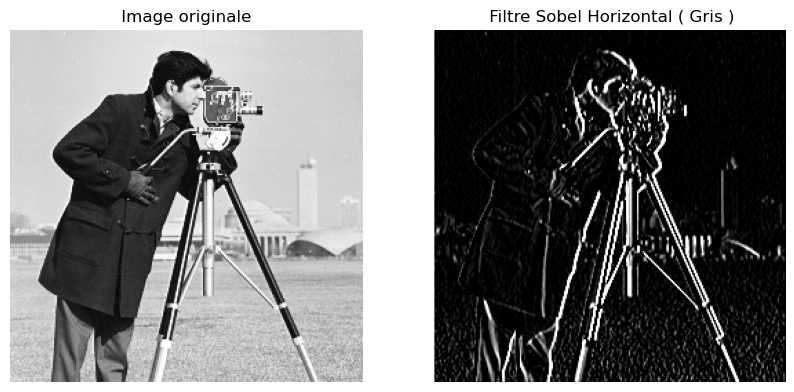

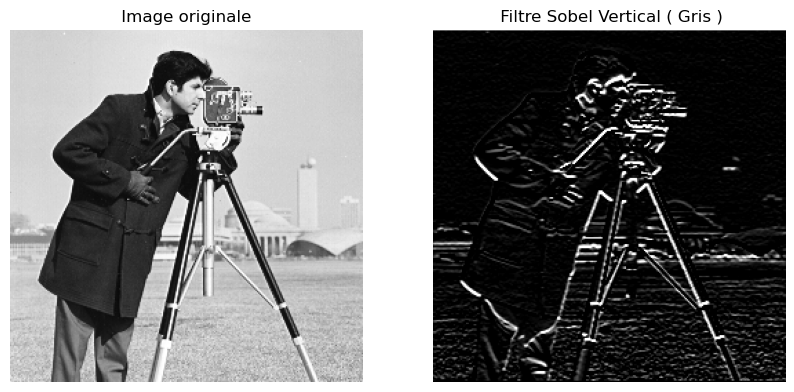

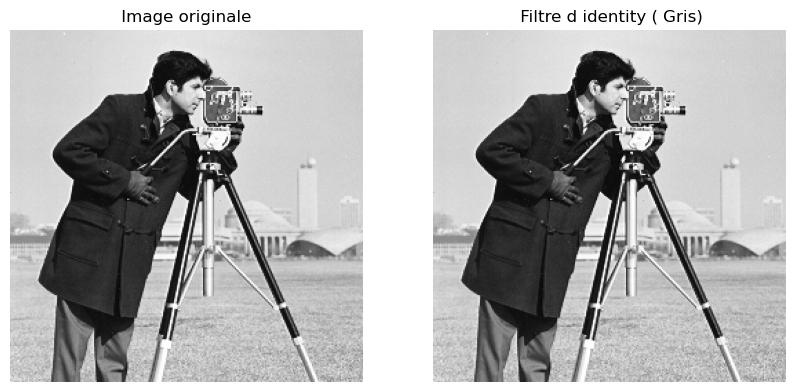

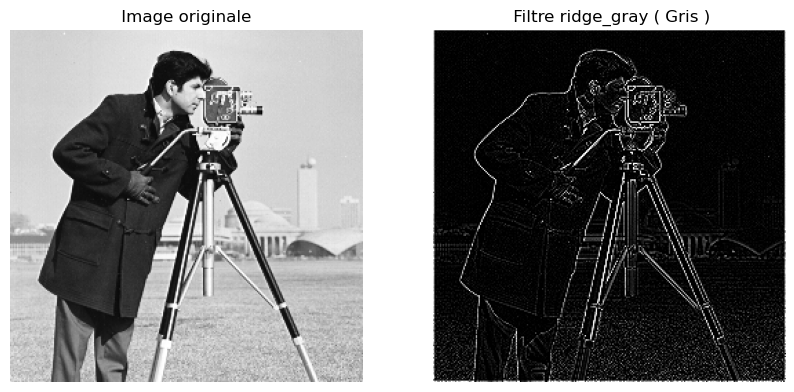

...

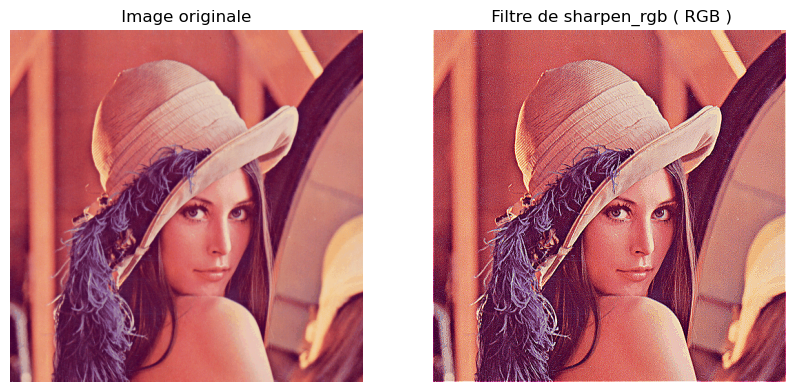

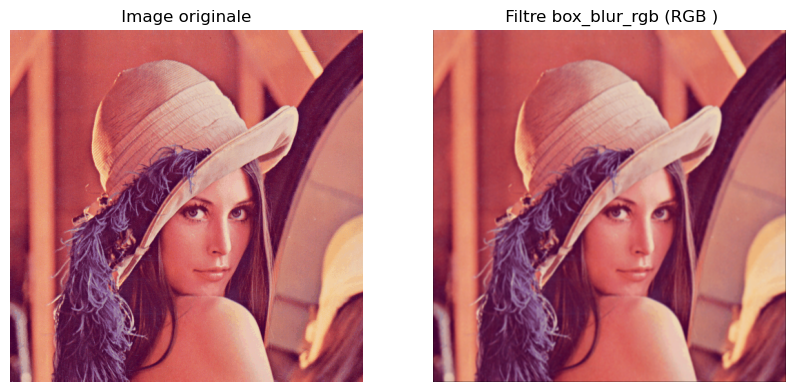

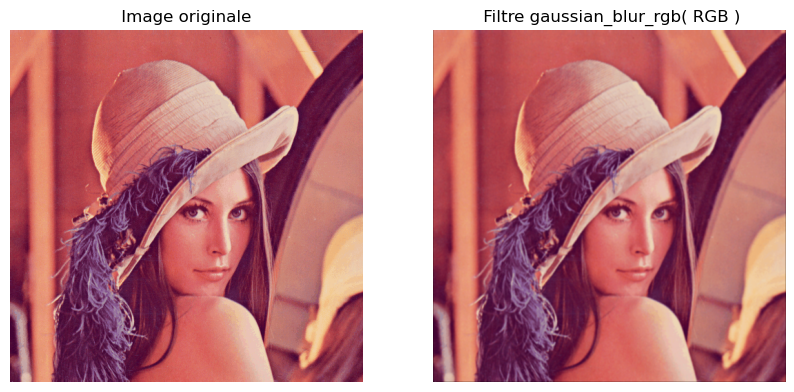

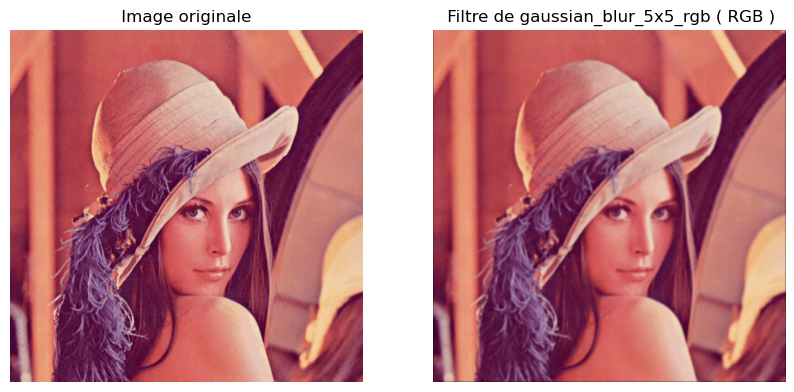

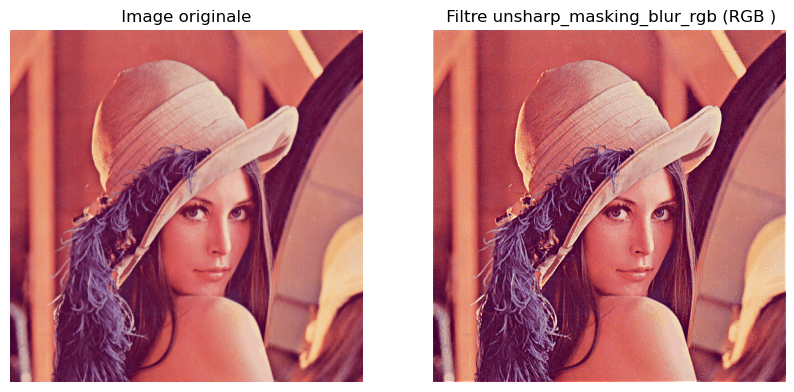

30

In [29]:

image_path =os.path.join(data_dir,"cameraman.bmp")
print(image_path)
gray_image = image_load(image_path,1)
image_path =os.path.join(data_dir,"lenna.bmp")
rgb_image = image_load(image_path,3)
# Appliquer les filtres sur l’image en niveaux de gris
blurred_gray = apply_convolution ( gray_image , blur_kernel )
sobel_h_gray = apply_convolution ( gray_image , sobel_horizontal )
sobel_v_gray = apply_convolution ( gray_image , sobel_vertical )
identity_gray = apply_convolution ( gray_image , identity )
ridge_gray = apply_convolution ( gray_image , ridge )
edge_gray = apply_convolution ( gray_image , edge )
sharpen_gray = apply_convolution ( gray_image , sharpen )
box_blur_gray = apply_convolution ( gray_image , box_blur )
gaussian_blur_gray = apply_convolution ( gray_image , gaussian_blur )
gaussian_blur_5x5_gray = apply_convolution ( gray_image , gaussian_blur_5x5 )
unsharp_masking_blur_gray = apply_convolution ( gray_image , unsharp_masking )
# TODO C o p m l t e r pour les autres filtres

# Appliquer les filtres sur l’image RGB
blurred_rgb = apply_convolution ( rgb_image , blur_kernel )
sobel_h_rgb = apply_convolution ( rgb_image , sobel_horizontal )
sobel_v_rgb = apply_convolution ( rgb_image , sobel_vertical )
identity_rgb = apply_convolution ( rgb_image , identity )
ridge_rgb = apply_convolution ( rgb_image , ridge )
edge_rgb = apply_convolution ( rgb_image , edge )
sharpen_rgb = apply_convolution ( rgb_image , sharpen )
box_blur_rgb = apply_convolution ( rgb_image , box_blur )
gaussian_blur_rgb = apply_convolution ( rgb_image , gaussian_blur )
gaussian_blur_5x5_rgb = apply_convolution ( rgb_image , gaussian_blur_5x5 )
unsharp_masking_blur_rgb = apply_convolution ( rgb_image , unsharp_masking )


# TODO C o p m l t e r pour les autres filtres

# Afficher les r s u l t a t s
display_images ( gray_image , blurred_gray , " Filtre de flou ( Gris)")
display_images ( gray_image , sobel_h_gray , " Filtre Sobel Horizontal ( Gris )")
display_images ( gray_image , sobel_v_gray , " Filtre Sobel Vertical ( Gris )")
display_images ( gray_image , identity_gray , " Filtre d identity ( Gris)")
display_images ( gray_image , ridge_gray , " Filtre ridge_gray ( Gris )")
display_images ( gray_image , edge_gray , " Filtre edge_gray ( Gris )")
display_images ( gray_image , sharpen_gray , " Filtre de sharpen_gray ( Gris)")
display_images ( gray_image , box_blur_gray , " Filtre box_blur_gray ( Gris )")
display_images ( gray_image , gaussian_blur_gray , " Filtre gaussian_blur_gray ( Gris )")
display_images ( gray_image , gaussian_blur_5x5_gray , " Filtre de gaussian_blur_5x5_gray ( Gris)")
display_images ( gray_image , unsharp_masking_blur_gray , " Filtre unsharp_masking_blur_gray ( Gris )")


display_images ( rgb_image , blurred_rgb , " Filtre de flou ( RGB )")
display_images ( rgb_image , sobel_h_rgb , " Filtre Sobel Horizontal (RGB )")
display_images ( rgb_image , sobel_v_rgb , " Filtre Sobel Vertical( RGB )")
display_images ( rgb_image , identity_rgb , " Filtre de identity_rgb ( RGB )")
display_images ( rgb_image , ridge_rgb , " Filtre ridge_rgb  (RGB )")
display_images ( rgb_image , edge_rgb , " Filtre edge_rgb ( RGB )")
display_images ( rgb_image , sharpen_rgb , " Filtre de sharpen_rgb ( RGB )")
display_images ( rgb_image , box_blur_rgb , " Filtre box_blur_rgb (RGB )")
display_images ( rgb_image , gaussian_blur_rgb , " Filtre gaussian_blur_rgb( RGB )")
display_images ( rgb_image , gaussian_blur_5x5_rgb , " Filtre de gaussian_blur_5x5_rgb ( RGB )")
display_images ( rgb_image , unsharp_masking_blur_rgb , " Filtre unsharp_masking_blur_rgb (RGB )")
# TODO C o p m l t e r pour les autres filtres


# Sauvegarder les r s u l t a t s
cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_gray.jpg"), blurred_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"sobel_h_gray.jpg"), sobel_h_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"sobel_v_gray.jpg"), sobel_v_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"identity_gray.jpg"), identity_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"ridge_gray.jpg"), ridge_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"edge_gray.jpg"), edge_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"sharpen_gray.jpg"), sharpen_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"box_blur_gray.jpg"), box_blur_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"gaussian_blur_gray.jpg"), gaussian_blur_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"gaussian_blur_5x5_gray.jpg"), gaussian_blur_5x5_gray )
cv2 . imwrite (os.path.join(data_dir_resultat,"unsharp_masking_blur_gray.jpg"), unsharp_masking_blur_gray )



cv2 . imwrite (os.path.join(data_dir_resultat,"blurred_rgb.jpg"), cv2 . cvtColor ( blurred_rgb , cv2.COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"sobel_h_rgb.jpg"), cv2 . cvtColor ( sobel_h_rgb , cv2.COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"sobel_v_rgb.jpg"), cv2 . cvtColor ( sobel_v_rgb , cv2 .COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"identity_rgb.jpg"), cv2 . cvtColor ( identity_rgb , cv2.COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"ridge_rgb.jpg"), cv2 . cvtColor ( ridge_rgb , cv2.COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"edge_rgb.jpg"), cv2 . cvtColor ( edge_rgb , cv2 .COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"sharpen_rgb.jpg"), cv2 . cvtColor ( sharpen_rgb , cv2.COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"box_blur_rgb.jpg"), cv2 . cvtColor ( box_blur_rgb , cv2.COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"gaussian_blur_rgb.jpg"), cv2 . cvtColor ( gaussian_blur_rgb , cv2 .COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"gaussian_blur_5x5_rgb.jpg"), cv2 . cvtColor ( gaussian_blur_5x5_rgb , cv2.COLOR_RGB2BGR ))
cv2 . imwrite (os.path.join(data_dir_resultat,"unsharp_masking_blur_rgb.jpg"), cv2 . cvtColor ( unsharp_masking_blur_rgb , cv2.COLOR_RGB2BGR ))

30 # TODO C o p m l t e r pour les autres filtres